In [1]:
import pandas as pd
import numpy as np
import folium
from geopy.geocoders import Nominatim
import seaborn as sns

df=pd.read_csv("Bank-Owned_ATM_Locations_in_New_York_State.csv")

In [2]:
latlon=df["Location 1"].str.split("\n", n = 3, expand = True)[2].str.replace("(","").str.replace(")","").str.split(",",n=2,expand= True)
df["lat"]=latlon[0]
df["lon"]=latlon[1]

In [3]:
df["lat"].describe()

count         4688
unique        4576
top       40.71647
freq             5
Name: lat, dtype: object

In [4]:
df.head()

,Name of Institution,Street Address,City,ZIP Code,County,Location 1,lat,lon
0,Abacus Federal Savings Bank,5518 8th Avenue,Brooklyn,11220.0,Kings,"5518 8th Avenue\nBrooklyn, NY 11220\n(40.63792...",40.637928,-74.007017
1,Abacus Federal Savings Bank,36-30 Main Street,Flushing,11354.0,Queens,"36 30 Main Street\nFlushing, NY 11354",None,None
2,Abacus Federal Savings Bank,6-8 Bowery,New York,10013.0,New York,"6 8\nNew York, NY 10013\n(40.73733, -74.00504)",40.73733,-74.00504
3,Abacus Federal Savings Bank,104-116 Nassau Street,New York,10038.0,New York,"104 116 Nassau Street\nNew York, NY 10038\n(40...",40.710658,-74.007268
4,Access Federal Credit Union,74-76 Main Street,Camden,13316.0,Oneida,"74 76 Main Street\nCamden, NY 13316\n(43.33504...",43.335045,-75.748044


In [5]:
address = 'New York City, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of New York City are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of New York City are 40.7127281, -74.0060152.


In [6]:
df["County_idx"]=df["County"].map(str)+" County"
df["County_idx"]=df["County_idx"].replace('Montogomery County','Montgomery County')

In [7]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location=[latitude, longitude], zoom_start=8)


    
#map_newyork

import folium
map_center=[41, -73.125]
map_newyork = folium.Map(location = map_center, zoom_start = 9)
for lat, lng, name, addr in zip(df['lat'], df['lon'], df['Name of Institution'], df['County_idx']):
    if lat is not None and pd.notna(lat):
        label = '{}, {}'.format(name, addr)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=1,
            popup=label,
            color='blue',
            fill=False,
            fill_color='#3186cc',
            fill_opacity=0.4,
            parse_html=False).add_to(map_newyork)  
map_newyork


In [8]:
# create map of New York using latitude and longitude values
map_newyork = folium.Map(location = map_center, zoom_start = 9)
 
#map_newyork

import folium
geo="https://raw.githubusercontent.com/codeforamerica/click_that_hood/master/public/data/new-york-counties.geojson"
map_center=[41, -73.125]
#newyork = folium.Map(location = map_center, zoom_start = 9)
map_newyork.choropleth(geo_data = geo, 
                   key_on = "feature.properties.name",
                   data = df["County_idx"].value_counts().reset_index(), columns = ["index", "County_idx"],
                   fill_opacity=0.9,
                   line_opacity=1,
                   legend_name = "ATM density per county")
# add markers to map
for lat, lng, name, addr in zip(df['lat'], df['lon'], df['Name of Institution'], df['County_idx']):
    if lat is not None and pd.notna(lat):
        label = '{}, {}'.format(name, addr)
        label = folium.Popup(label, parse_html=True)
        folium.CircleMarker(
            [lat, lng],
            radius=2,
            popup=label,
            color='red',
            fill=True,
            fill_color='#3186cc',
            opacity=0.1,
            parse_html=False).add_to(map_newyork)  
map_newyork


/home/cedric/miniconda3/lib/python3.7/site-packages/folium/folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [9]:
pop = pd.read_html("https://www.newyork-demographics.com/counties_by_population",
                          header=0,
                          attrs={"class":"ranklist"})[0]
pop.drop("Rank",axis=1,inplace=True)
pop.drop(62,axis=0,inplace=True)
pop["Population"]=pd.to_numeric(pop["Population"], errors='raise')

In [10]:
df.shape

(5612, 9)

In [11]:
df.merge(pop, left_on='County_idx', right_on='County').shape

(5612, 11)

In [12]:
atm_count=df["County_idx"].value_counts().reset_index()
atm_count.rename(columns={'County_idx': 'ATM_count',"index":"County"},inplace=True)
atm_count
dd=atm_count.merge(pop, left_on='County', right_on='County')
dd

,County,ATM_count,Population
0,New York County,667,1632480
1,Nassau County,519,1356564
2,Suffolk County,485,1487901
3,Queens County,421,2298513
4,Kings County,392,2600747
...,...,...,...
57,Orleans County,9,41175
58,Yates County,9,25009
59,Lewis County,8,26719
60,Schuyler County,6,17992


In [13]:
dd

,County,ATM_count,Population
0,New York County,667,1632480
1,Nassau County,519,1356564
2,Suffolk County,485,1487901
3,Queens County,421,2298513
4,Kings County,392,2600747
...,...,...,...
57,Orleans County,9,41175
58,Yates County,9,25009
59,Lewis County,8,26719
60,Schuyler County,6,17992


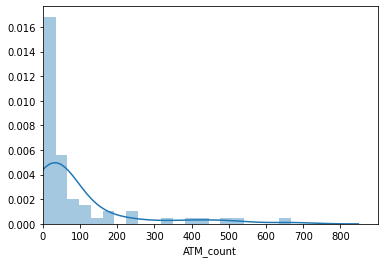

In [14]:
sns.distplot(dd["ATM_count"]).set(xlim=(0));

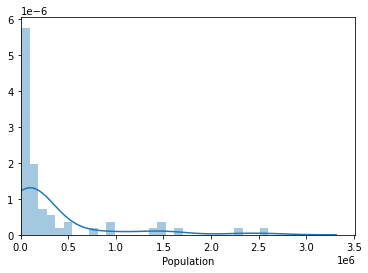

In [15]:
sns.distplot(dd["Population"]).set(xlim=(0));

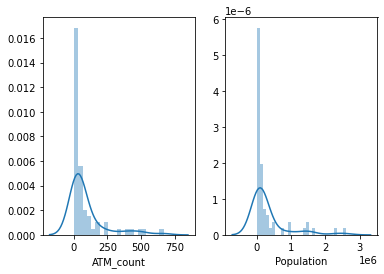

In [16]:
import matplotlib.pyplot as plt
l=['ATM_count', 'Population']
fig, ax = plt.subplots(1, 2)
sns.distplot(dd['ATM_count'],ax=ax[0])
sns.distplot(dd['Population'],ax=ax[1])
plt.show()

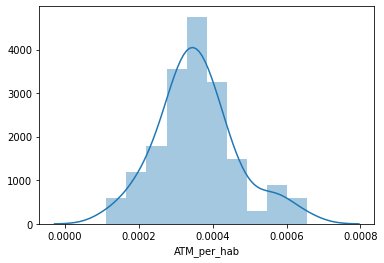

In [17]:
dd["ATM_per_hab"]=dd["ATM_count"]/dd["Population"]
sns.distplot(dd["ATM_per_hab"]);

In [18]:
dd.nsmallest(5,"ATM_per_hab")

,County,ATM_count,Population,ATM_per_hab
9,Bronx County,162,1437872,0.000113
4,Kings County,392,2600747,0.000151
3,Queens County,421,2298513,0.000183
23,Niagara County,42,211704,0.000198
56,Fulton County,11,53743,0.000205


In [19]:
dd.nlargest(5,"ATM_per_hab")

,County,ATM_count,Population,ATM_per_hab
61,Hamilton County,3,4575,0.000656
27,Warren County,39,64480,0.000605
41,Essex County,22,37751,0.000583
29,Otsego County,34,60244,0.000564
37,Delaware County,25,45502,0.000549


In [20]:
wealth = pd.read_html("https://en.wikipedia.org/wiki/List_of_New_York_locations_by_per_capita_income",
                          header=0,
                          attrs={"class":"wikitable sortable"})[0]
wealth.drop("Rank",axis=1,inplace=True)
wealth["County"]=wealth["County"].apply(lambda s: s if(s.endswith("County")) else s+" County" )
wealth["Medianhouseholdincome"]=pd.to_numeric(wealth["Medianhouseholdincome"].str.replace("$","").str.replace(",",""), errors='raise')
wealth["Per capitaincome"]=pd.to_numeric(wealth["Per capitaincome"].str.replace("$","").str.replace(",",""), errors='raise')


In [21]:
ddd=dd.merge(wealth, left_on='County', right_on='County')

In [22]:
ddd.head()

,County,ATM_count,Population_x,ATM_per_hab,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
0,New York County,667,1632480,0.000409,111386,64971,"$75,629",1585873,763846
1,Nassau County,519,1356564,0.000383,41387,93613,"$107,934",1339532,448528
2,Suffolk County,485,1487901,0.000326,35755,84506,"$96,220",1493350,499922
3,Queens County,421,2298513,0.000183,25553,55291,"$62,459",2230722,780117
4,Kings County,392,2600747,0.000151,23605,43567,"$48,777",2504700,916856


In [24]:
ddd.nlargest(5,"Medianhouseholdincome")

,County,ATM_count,Population_x,ATM_per_hab,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
1,Nassau County,519,1356564,0.000383,41387,93613,"$107,934",1339532,448528
39,Putnam County,24,99070,0.000242,37915,89218,"$101,576",99710,35041
2,Suffolk County,485,1487901,0.000326,35755,84506,"$96,220",1493350,499922
15,Rockland County,82,323686,0.000253,34304,82534,"$96,836",311687,99242
5,Westchester County,326,968815,0.000336,73159,79619,"$100,863",949113,347232


In [25]:
ddd.nsmallest(5,"Medianhouseholdincome")

,County,ATM_count,Population_x,ATM_per_hab,Per capitaincome,Medianhouseholdincome,Medianfamilyincome,Population_y,Number ofhouseholds
9,Bronx County,162,1437872,0.000113,17575,34264,"$38,431",1385108,483449
24,Chautauqua County,42,129656,0.000324,21033,40639,"$51,031",134905,54244
42,Allegany County,22,47025,0.000468,20058,41305,"$49,864",48946,18208
49,Franklin County,18,50692,0.000355,19807,42050,"$50,816",51599,19054
33,St. Lawrence County,31,109558,0.000283,20143,42303,"$50,384",111944,41605


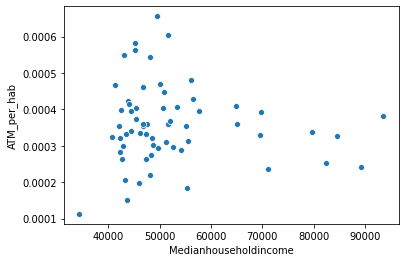

In [26]:
sns.scatterplot(ddd["Medianhouseholdincome"],ddd["ATM_per_hab"])

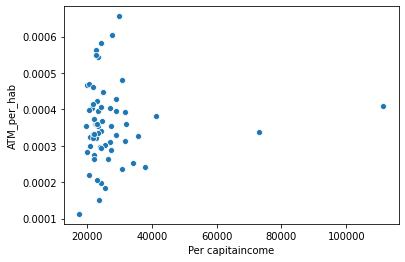

In [27]:
sns.scatterplot(ddd["Per capitaincome"],ddd["ATM_per_hab"])